## Single generative script
IMP : This has to be merged with the previous one. Currently created to quickly generate all the different files.

NB : It was seen that running this with the previous code always crashes the kernel, but now it works.

In [1]:
# Import necessary libraries
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import copy
from datetime import datetime
from tqdm.notebook import tqdm
from IPython.display import display
import glob
import h5py

# Import custom modules
import src.data_loader as data_loader
import src.processor as processor

# Set matplotlib style
%matplotlib widget
%load_ext autoreload
%autoreload 2
plt.style.use('../anemotaxis.mplstyle')

In [2]:
def find_dates_in_base_path(base_path):
    """Find all date folders containing trx.mat files in the base path"""
    date_paths = []
    
    for root, dirs, files in os.walk(base_path):
        if "trx.mat" in files:
            date_str = os.path.basename(root)
            # Check if it's a date folder (format: YYYYMMDD_HHMMSS)
            if len(date_str) == 15 and date_str[8] == "_":
                date_paths.append({
                    'path': os.path.join(root, "trx.mat"),
                    'date_str': date_str
                })
    
    # Sort by date
    date_paths.sort(key=lambda x: x['date_str'])
    return date_paths

def process_single_date(trx_path, date_str):
    """Process a single date's tracking data"""
    print(f"Processing {date_str}...")
    
    # Process file
    date_str, extracted_data, metadata = data_loader.process_single_file(trx_path, show_progress=True)
    
    # Filter data
    filtered_data = processor.filter_larvae_by_duration(extracted_data, min_total_duration=300)
    filtered_data, stop_time_stats = processor.filter_larvae_by_excess_stop_time(
        filtered_data, max_stop_percentage=0.4
    )
    
    # Calculate behavior stats
    behavior_stats = processor.plot_behavior_duration_histograms(
        filtered_data, show_plot=False, using_frames=False
    )
    
    # Merge short stops
    merged_data, merge_summary = processor.merge_short_stop_sequences(
        filtered_data, behavior_stats,
        min_stop_duration_cast=3.0, min_stop_duration_run=3.0
    )
    
    print(f"  - {len(filtered_data)} larvae after filtering")
    print(f"  - {merge_summary['cast_stop_cast_count']} cast-stop-cast sequences merged")
    print(f"  - {merge_summary['run_stop_run_count']} run-stop-run sequences merged")
    
    return {
        'date_str': date_str,
        'raw_data': extracted_data,
        'filtered_data': filtered_data,
        'merged_data': merged_data,
        'behavior_stats': behavior_stats,
        'metadata': metadata
    }

def process_all_dates(base_path):
    """Process all date folders in the base path"""
    print(f"Finding date folders in {base_path}...")
    date_paths = find_dates_in_base_path(base_path)
    
    if not date_paths:
        print("No date folders with trx.mat found!")
        return None
    
    print(f"Found {len(date_paths)} dates with tracking data")
    
    # Process each date
    all_dates_data = {}
    for date_info in date_paths:
        date_str = date_info['date_str']
        trx_path = date_info['path']
        
        date_data = process_single_date(trx_path, date_str)
        all_dates_data[date_str] = date_data
    
    # Process all dates together
    print("\nProcessing all dates together...")
    all_data = data_loader.process_all_trx_files(base_path)
    
    # Filter and merge the combined data
    filtered_all_data = processor.filter_larvae_by_duration(all_data, min_total_duration=300)
    filtered_all_data, exp_stop_stats = processor.filter_larvae_by_excess_stop_time(
        filtered_all_data, max_stop_percentage=0.4
    )
    
    behavior_stats_all = processor.plot_behavior_duration_histograms(
        filtered_all_data, show_plot=False, using_frames=False
    )
    
    merged_all_data, merge_summary_all = processor.merge_short_stop_sequences(
        filtered_all_data, behavior_stats_all,
        min_stop_duration_cast=3.0, min_stop_duration_run=3.0
    )
    
    # Add combined data to the result
    all_dates_data['all_combined'] = {
        'date_str': 'All Combined',
        'raw_data': all_data,
        'filtered_data': filtered_all_data,
        'merged_data': merged_all_data,
        'behavior_stats': behavior_stats_all
    }
    
    return all_dates_data

def compute_orientation_tail_to_neck(x_tail, y_tail, x_neck, y_neck):
    """
    Compute orientation angle between tail-to-neck vector and negative x-axis.
    Returns angle in degrees, where 0° = facing -x (downstream), ±180° = +x (upstream).
    """
    v_x = x_neck - x_tail
    v_y = y_neck - y_tail
    angle_rad = np.arctan2(v_y, -v_x)  # -v_x for -x axis
    angle_deg = np.degrees(angle_rad)
    angle_deg = (angle_deg + 180) % 360 - 180
    return angle_deg

In [22]:
# Process all dates in the base path
# Set the base path - change this to analyze different genotypes
# base_path = "/Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"

base_path = "/Users/sharbat/Desktop/Sharbat_DAN_data_June2025/FCF_attP2-40@UAS_TNT_2_0003" #june 2025 data new
# base_path = "/Users/sharbat/Desktop/Sharbat_DAN_data_June2025/GMR_00864@UAS_TNT_2_0003"
# Get genotype name for titles
genotype = os.path.basename(os.path.dirname(base_path))

# Create output directory
output_dir = f"../results/analysis/{genotype}"
os.makedirs(output_dir, exist_ok=True)

print(f"Analyzing data for {genotype}...")
all_dates_data = process_all_dates(base_path)

# Show summary of processed data
print("\nProcessed data summary:")
for date_key, date_data in all_dates_data.items():
    if date_key == 'all_combined':
        larvae_count = len(date_data['filtered_data']['data']) if 'data' in date_data['filtered_data'] else len(date_data['filtered_data'])
        print(f"All combined: {larvae_count} larvae after filtering")
    else:
        larvae_count = len(date_data['filtered_data'])
        print(f"{date_key}: {larvae_count} larvae after filtering")

Analyzing data for Sharbat_DAN_data_June2025...
Finding date folders in /Users/sharbat/Desktop/Sharbat_DAN_data_June2025/FCF_attP2-40@UAS_TNT_2_0003...
Found 3 dates with tracking data
Processing 20250606_141850...

Processing file: /Users/sharbat/Desktop/Sharbat_DAN_data_June2025/FCF_attP2-40@UAS_TNT_2_0003/20250606_141850/trx.mat
Number of larvae: 52


Processing larvae:   0%|          | 0/52 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 1 larvae with >40% time in stop state
  - 8 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 8
Total actions: 480

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      244   50.8%      0.94       0.67       0.92        89        122
        cast:      154   32.1%      0.78       0.42       1.02        52         77
        stop:       62   12.9%      0.36       0.34       0.08        29         31
       hunch:        6    1.2%      0.15       0.09       0.10         2          2
      backup:       14    2.9%      0.52       0.42       0.26         4          7

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 8
Total actions: 651

    Behavior   Events  %Total       Mean     Median  

Processing larvae:   0%|          | 0/27 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 0 larvae with >40% time in stop state
  - 9 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 9
Total actions: 574

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      265   46.2%      1.30       0.88       1.22       106        132
        cast:      179   31.2%      0.71       0.40       0.83        56         89
        stop:      105   18.3%      0.37       0.35       0.07        44         52
       hunch:        4    0.7%      0.24       0.23       0.07         2          2
      backup:       21    3.7%      0.47       0.43       0.21         9         10

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 9
Total actions: 808

    Behavior   Events  %Total       Mean     Median  

Processing larvae:   0%|          | 0/45 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 0 larvae with >40% time in stop state
  - 8 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 8
Total actions: 900

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      436   48.4%      0.96       0.50       1.23       139        218
        cast:      214   23.8%      0.54       0.33       0.68        64        107
        stop:      189   21.0%      0.34       0.33       0.06        70         94
       hunch:       21    2.3%      0.17       0.16       0.11         6         10
      backup:       40    4.4%      0.39       0.33       0.19        13         20

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 8
Total actions: 766

    Behavior   Events  %Total       Mean     Median  

Processing trx files:   0%|          | 0/3 [00:00<?, ?it/s]


Processed 3 files
Total larvae: 124
Excess stop time filtering results (threshold: 40%):
  - Removed 1 larvae with >40% time in stop state
  - 25 larvae remaining

Large Behaviors duration analysis (seconds) for All Experiments
Number of larvae: 25
Total actions: 1954

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      945   48.4%      1.05       0.61       1.17       333        472
        cast:      547   28.0%      0.67       0.35       0.84       172        273
        stop:      356   18.2%      0.35       0.34       0.07       149        174
       hunch:       31    1.6%      0.18       0.16       0.10        10         15
      backup:       75    3.8%      0.44       0.39       0.22        28         37

Small Behaviors duration analysis (seconds) for All Experiments
Number of larvae: 25
Total actions: 2225

    Behavior   Events

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import copy
from scipy.ndimage import gaussian_filter1d

def analyze_cast_orientations_all_true(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze cast probability vs. orientation using tail-to-neck orientation.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter1d

    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    all_orientations = []
    all_is_cast = []

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_cast = states == 2

            # Use tail-to-neck orientation if available
            if all(k in larva_data for k in ['x_tail', 'y_tail', 'x_neck', 'y_neck']):
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                x_neck = np.array(larva_data['x_neck']).flatten()
                y_neck = np.array(larva_data['y_neck']).flatten()
                min_len = min(len(x_tail), len(y_tail), len(x_neck), len(y_neck), len(states))
                x_tail = x_tail[:min_len]
                y_tail = y_tail[:min_len]
                x_neck = x_neck[:min_len]
                y_neck = y_neck[:min_len]
                is_cast = is_cast[:min_len]
                orientations = compute_orientation_tail_to_neck(x_tail, y_tail, x_neck, y_neck)
            # Fallback to head-tail if available
            elif all(k in larva_data for k in ['x_head', 'y_head', 'x_tail', 'y_tail']):
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                min_len = min(len(x_head), len(y_head), len(x_tail), len(y_tail), len(states))
                x_head = x_head[:min_len]
                y_head = y_head[:min_len]
                x_tail = x_tail[:min_len]
                y_tail = y_tail[:min_len]
                is_cast = is_cast[:min_len]
                dx = x_head - x_tail
                dy = y_head - y_tail
                orientations = np.degrees(np.arctan2(dy, -dx))
            else:
                continue

            all_orientations.extend(orientations)
            all_is_cast.extend(is_cast)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_orientations:
        ax.text(0.5, 0.5, "No cast orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'cast_prob': np.array([]), 'bin_centers': np.array([])}

    orientations = np.array(all_orientations)
    is_cast = np.array(all_is_cast)

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    cast_prob = np.zeros_like(bin_centers, dtype=float)
    total_counts = np.zeros_like(bin_centers, dtype=int)

    for i in range(len(bin_centers)):
        bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
        if np.any(bin_mask):
            total_counts[i] = np.sum(bin_mask)
            cast_prob[i] = np.sum(is_cast[bin_mask]) / total_counts[i]

    smoothed_prob = gaussian_filter1d(cast_prob, sigma=sigma)

    ax.plot(bin_centers, smoothed_prob, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Cast Probability')
    ax.set_xlim(-180, 180)
    ax.set_ylim(0, 1.05)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'cast_prob': cast_prob,
        'smoothed_prob': smoothed_prob,
        'total_counts': total_counts
    }

def plot_global_behavior_matrix(trx_data, show_separate_totals=True, show_plot=True, ax=None):
    """
    Plot global behavior using the global state.
    
    This function visualizes behavioral states across time for all larvae.
    It processes both large_state (1-6) and small_large_state (0.5-5.5) values.
    
    Args:
        trx_data: Dictionary of larva data
        show_separate_totals: If True, show large, small, and total behaviors as separate rows
                             If False, show only a single row per larva
        show_plot: Whether to display the plot immediately
        ax: Optional matplotlib axes to plot on
    
    Returns:
        Behavior matrix or dict of processed data depending on mode
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D

    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(12, 8))
        created_fig = True
    else:
        created_fig = False
    
    # Define state value mapping (both integer and half-integer values)
    # Maps state values to behavior names and colors
    state_mapping = {
        # Large behaviors (integer values)
        1.0: {'name': 'large_run', 'base': 'run', 'color': [0.0, 0.0, 0.0]},      # Black
        2.0: {'name': 'large_cast', 'base': 'cast', 'color': [1.0, 0.0, 0.0]},     # Red
        3.0: {'name': 'large_stop', 'base': 'stop', 'color': [0.0, 1.0, 0.0]},     # Green
        4.0: {'name': 'large_hunch', 'base': 'hunch', 'color': [0.0, 0.0, 1.0]},    # Blue
        5.0: {'name': 'large_backup', 'base': 'backup', 'color': [1.0, 0.5, 0.0]},   # Orange
        6.0: {'name': 'large_roll', 'base': 'roll', 'color': [0.5, 0.0, 0.5]},     # Purple
        
        # Small behaviors (half-integer values)
        0.5: {'name': 'small_run', 'base': 'run', 'color': [0.7, 0.7, 0.7]},      # Light gray
        1.5: {'name': 'small_cast', 'base': 'cast', 'color': [1.0, 0.7, 0.7]},     # Light red
        2.5: {'name': 'small_stop', 'base': 'stop', 'color': [0.7, 1.0, 0.7]},     # Light green
        3.5: {'name': 'small_hunch', 'base': 'hunch', 'color': [0.7, 0.7, 1.0]},    # Light blue
        4.5: {'name': 'small_backup', 'base': 'backup', 'color': [1.0, 0.8, 0.6]},   # Light orange
        5.5: {'name': 'small_roll', 'base': 'roll', 'color': [0.8, 0.6, 0.8]}      # Light purple
    }
    
    # Define total behavior colors (medium shade between large and small)
    total_behavior_colors = {
        'run': [0.4, 0.4, 0.4],       # Medium gray
        'cast': [0.8, 0.3, 0.3],      # Medium red
        'stop': [0.3, 0.8, 0.3],      # Medium green
        'hunch': [0.3, 0.3, 0.8],     # Medium blue
        'backup': [0.8, 0.6, 0.3],    # Medium orange
        'roll': [0.6, 0.3, 0.6]       # Medium purple
    }

    # Process larvae data
    if isinstance(trx_data, dict) and 'data' in trx_data:
        larvae_data = trx_data['data']
    else:
        larvae_data = trx_data
        
    larva_ids = sorted(larvae_data.keys())
    n_larvae = len(larva_ids)
    
    if n_larvae == 0:
        ax.text(0.5, 0.5, "No larvae data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Compute time ranges
    tmins = []
    tmaxs = []
    for lid in larva_ids:
        if 't' in larvae_data[lid] and len(larvae_data[lid]['t']) > 0:
            times = np.array(larvae_data[lid]['t']).flatten()
            if len(times) > 0:
                tmins.append(np.min(times))
                tmaxs.append(np.max(times))
    
    if not tmins:
        ax.text(0.5, 0.5, "No time data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    t_min = min(tmins)
    t_max = max(tmaxs)
    
    # Decide on plotting approach based on show_separate_totals
    if show_separate_totals:
        # Create full behavior matrix with colors (as in original function)
        resolution = 1000
        behavior_matrix = np.full((n_larvae * 3, resolution, 3), fill_value=1.0)  # white background
        
        # Process each larva
        for larva_idx, lid in enumerate(larva_ids):
            # Get time and state data
            if 't' not in larvae_data[lid] or len(larvae_data[lid]['t']) == 0:
                continue  # Skip larvae without required data
                
            larva_time = np.array(larvae_data[lid]['t']).flatten()
            
            # Use global_state_small_large_state if available, otherwise use global_state_large_state
            if 'global_state_small_large_state' in larvae_data[lid]:
                states = np.array(larvae_data[lid]['global_state_small_large_state']).flatten()
            elif 'global_state_large_state' in larvae_data[lid]:
                states = np.array(larvae_data[lid]['global_state_large_state']).flatten()
            else:
                continue  # Skip if no state data available
            
            # Ensure arrays have same length
            min_len = min(len(larva_time), len(states))
            if min_len == 0:
                continue
                
            larva_time = larva_time[:min_len]
            states = states[:min_len]
            
            # Convert times to indices
            time_indices = np.floor(
                ((larva_time - t_min) / (t_max - t_min) * (resolution - 1))
            ).astype(int)
            time_indices = np.clip(time_indices, 0, resolution - 1)

            # Arrays to store large, small and total behaviors
            large_behaviors = np.full((resolution, 3), fill_value=1.0)  # white background
            small_behaviors = np.full((resolution, 3), fill_value=1.0)  # white background
            total_behaviors = np.full((resolution, 3), fill_value=1.0)  # white background
            
            # For each unique time index, use the corresponding state
            unique_indices = np.unique(time_indices)
            for t_idx in unique_indices:
                mask = time_indices == t_idx
                if np.any(mask):
                    state_val = float(states[mask][0])  # Take first state if multiple exist
                    
                    # Round to nearest 0.5 to handle potential floating point issues
                    state_val = round(state_val * 2) / 2
                    
                    # Determine if this is a large or small behavior
                    is_large = state_val.is_integer()
                    is_small = not is_large
                    
                    # Assign colors based on state
                    if state_val in state_mapping:
                        behavior_info = state_mapping[state_val]
                        
                        if is_large:
                            large_behaviors[t_idx] = behavior_info['color']
                            total_behaviors[t_idx] = total_behavior_colors[behavior_info['base']]
                        elif is_small:
                            small_behaviors[t_idx] = behavior_info['color']
                            total_behaviors[t_idx] = total_behavior_colors[behavior_info['base']]
            
            # Assign the arrays to the behavior matrix
            row_large = larva_idx * 3
            row_small = larva_idx * 3 + 1
            row_total = larva_idx * 3 + 2
            
            behavior_matrix[row_large] = large_behaviors
            behavior_matrix[row_small] = small_behaviors
            behavior_matrix[row_total] = total_behaviors

        # Plot the behavior matrix
        ax.imshow(behavior_matrix, aspect='auto', interpolation='nearest', alpha=0.8,
                extent=[t_min, t_max, behavior_matrix.shape[0], 0])
        
        # Create y-tick labels
        ytick_positions = []
        ytick_labels = []
        
        for i, lid in enumerate(larva_ids):
            base_pos = i * 3
            # Position ticks in the middle of each row
            ytick_positions.extend([base_pos + 0.5, base_pos + 1.5, base_pos + 2.5])
            ytick_labels.extend([f"{lid} (large)", f"{lid} (small)", f"{lid} (total)"])
        
        ax.set_yticks(ytick_positions)
        ax.set_yticklabels(ytick_labels, fontsize='small')
        
        # Add horizontal lines to separate larvae
        for i in range(1, n_larvae):
            y_pos = i * 3
            ax.axhline(y=y_pos, color='black', linestyle='-', linewidth=0.5)
        
        # Add legend with all states
        legend_elements = []
        
        # Add large behaviors to legend
        for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Patch(facecolor=info['color'], 
                        label=f"{info['base']} (large)")
                )
        
        # Add a separator in the legend
        legend_elements.append(Patch(facecolor='white', label=''))
        
        # Add small behaviors to legend
        for state_val in [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Patch(facecolor=info['color'], 
                        label=f"{info['base']} (small)")
                )
        
        # Add a separator in the legend
        legend_elements.append(Patch(facecolor='white', label=''))
        
        # Add total behaviors to legend
        for base_name, color in total_behavior_colors.items():
            legend_elements.append(
                Patch(facecolor=color, label=f"{base_name} (total)")
            )
        
        # Add "Other" category
        legend_elements.append(Patch(facecolor=[1, 1, 1], label='Other'))
        
        ax.legend(handles=legend_elements, loc='center left', 
                bbox_to_anchor=(1, 0.5), title='Behavioral States')
        
    else:
        # Use the scatter plot approach for single row per larva, plotting ALL behaviors
        ytick_positions = []
        ytick_labels = []
        
        for i, larva_id in enumerate(larva_ids):
            if 'global_state_large_state' not in larvae_data[larva_id] or 't' not in larvae_data[larva_id]:
                continue  # Skip larvae without required data
            
            times = np.array(larvae_data[larva_id]['t']).flatten()
            states = np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
            
            # Check if times are sorted
            if not np.all(np.diff(times) >= 0) and len(times) > 1:
                # Sort times and states
                sorted_indices = np.argsort(times)
                times = times[sorted_indices]
                states = states[sorted_indices]
            
            # Ensure both arrays have same length
            min_len = min(len(times), len(states))
            if min_len == 0:
                continue
                
            times = times[:min_len]
            states = states[:min_len]
            
            # Draw thin line across total time range
            ax.plot([times[0], times[-1]], [i, i], 'k-', linewidth=0.5, alpha=0.2)
            
            # Draw colored segments for each behavior state with appropriate colors
            # Plot ALL behaviors, not just run, cast, and stop
            for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
                if state_val in state_mapping:
                    info = state_mapping[state_val]
                    mask = states == state_val
                    if np.any(mask):
                        ax.scatter(times[mask], [i] * sum(mask), 
                                 color=info['color'], s=5, marker='s', alpha=0.8)
            
            ytick_positions.append(i)
            ytick_labels.append(str(larva_id))
        
        # Set axis properties
        ax.set_yticks(ytick_positions)
        ax.set_yticklabels(ytick_labels)
        
        # Add legend with all behavioral states
        legend_elements = []
        for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Line2D([0], [0], marker='s', color='w', 
                          markerfacecolor=info['color'], markersize=8, 
                          label=f"{info['base']}")
                )
        
        ax.legend(handles=legend_elements, loc='upper right')
    
    # Set common axis properties
    ax.set_xlabel('Time (seconds)')
    ax.set_ylabel('Larva ID')
    # Title removed as requested
    ax.set_xlim(t_min, t_max)
    
    # Only show if we created our own figure and show_plot is True
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    # Return the processed data
    result_data = {}
    for larva_id in larva_ids:
        if 'global_state_large_state' in larvae_data[larva_id] and 't' in larvae_data[larva_id]:
            result_data[larva_id] = {
                'times': np.array(larvae_data[larva_id]['t']).flatten(),
                'states': np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
            }
    
    return result_data

def analyze_turn_rate_by_orientation_true(
    trx_data, bin_width=10, show_plot=True, ax=None, sigma=2, min_turn_amplitude=60
):
    """
    Analyze turn rate (turns/sec) vs orientation.
    A turn is defined as a cast (state==2 or state==1.5) that results in an orientation change >= min_turn_amplitude (deg).
    The orientation at which the turn occurs is the *initial* orientation at cast onset.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter1d

    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    turn_counts = np.zeros_like(bin_centers, dtype=float)
    total_time = np.zeros_like(bin_centers, dtype=float)

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data or 't' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            t = np.array(larva_data['t']).flatten()

            # Use tail-to-neck orientation if available
            if all(k in larva_data for k in ['x_tail', 'y_tail', 'x_neck', 'y_neck']):
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                x_neck = np.array(larva_data['x_neck']).flatten()
                y_neck = np.array(larva_data['y_neck']).flatten()
                min_len = min(len(x_tail), len(y_tail), len(x_neck), len(y_neck), len(states), len(t))
                x_tail = x_tail[:min_len]
                y_tail = y_tail[:min_len]
                x_neck = x_neck[:min_len]
                y_neck = y_neck[:min_len]
                states = states[:min_len]
                t = t[:min_len]
                orientations = compute_orientation_tail_to_neck(x_tail, y_tail, x_neck, y_neck)
            else:
                continue

            # Find all cast (state==2 or state==1.5) segments
            i = 0
            while i < len(states):
                if states[i] == 2 or states[i] == 1.5:
                    cast_start = i
                    while i < len(states) and (states[i] == 2 or states[i] == 1.5):
                        i += 1
                    cast_end = i - 1
                    # Only consider casts with at least 2 frames
                    if cast_end > cast_start:
                        orient_start = orientations[cast_start]
                        orient_end = orientations[cast_end]
                        # Compute orientation change (handle wraparound)
                        delta = np.angle(np.exp(1j * np.deg2rad(orient_end - orient_start)), deg=True)
                        if np.abs(delta) >= min_turn_amplitude:
                            # Bin by initial orientation
                            for j in range(len(bin_centers)):
                                if bins[j] <= orient_start < bins[j+1]:
                                    turn_counts[j] += 1
                                    break
                else:
                    i += 1

            # Bin total time spent in each orientation (all frames)
            for j in range(len(bin_centers)):
                bin_mask = (orientations >= bins[j]) & (orientations < bins[j+1])
                t_bin = t[bin_mask]
                if len(t_bin) > 1:
                    total_time[j] += np.sum(np.diff(t_bin))
                elif len(t_bin) == 1 and len(t) > 1:
                    dt = np.median(np.diff(t))
                    total_time[j] += dt

        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    # Compute turn rate per second
    turn_rate_per_sec = np.zeros_like(bin_centers, dtype=float)
    for j in range(len(bin_centers)):
        if total_time[j] > 0:
            turn_rate_per_sec[j] = turn_counts[j] / total_time[j]

    smoothed_rates = gaussian_filter1d(turn_rate_per_sec, sigma=sigma)

    if ax is not None:
        ax.plot(bin_centers, smoothed_rates, color='purple', linewidth=2)
        ax.set_xlabel('Orientation (°)')
        ax.set_ylabel('Turn Rate (turns/sec)')
        ax.set_xlim(-180, 180)
        ax.grid(True, alpha=0.3)
        ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
        ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
        ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
        if created_fig and show_plot:
            plt.tight_layout()
            plt.show()

    return {
        'bin_centers': bin_centers,
        'turn_counts': turn_counts,
        'total_time': total_time,
        'turn_rate_per_sec': turn_rate_per_sec,
        'smoothed_rates': smoothed_rates
    }

def get_orientation_array(larva_data):
    """
    Always compute orientation as tail-to-neck relative to -x axis.
    Returns None if required keys are missing.
    """
    required_keys = ['x_tail', 'y_tail', 'x_neck', 'y_neck']
    if all(k in larva_data for k in required_keys):
        x_tail = np.array(larva_data['x_tail']).flatten()
        y_tail = np.array(larva_data['y_tail']).flatten()
        x_neck = np.array(larva_data['x_neck']).flatten()
        y_neck = np.array(larva_data['y_neck']).flatten()
        min_len = min(len(x_tail), len(y_tail), len(x_neck), len(y_neck))
        return compute_orientation_tail_to_neck(
            x_tail[:min_len], y_tail[:min_len], x_neck[:min_len], y_neck[:min_len]
        )
    return None

def analyze_run_orientations_all(experiments_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """Analyze run orientations using tail-to-neck orientation definition."""
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    all_run_orientations = []

    if isinstance(experiments_data, dict) and 'data' in experiments_data:
        data_to_process = experiments_data['data']
    else:
        data_to_process = experiments_data

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            runs = np.logical_or(states == 1, states == 0.5)
            if runs.sum() == 0:
                continue
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(runs))
            orientations = orientations[:min_len]
            runs = runs[:min_len]
            all_run_orientations.extend(orientations[runs])
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_run_orientations:
        ax.text(0.5, 0.5, "No run orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'hist': np.array([]), 'bin_centers': np.array([])}

    bins = np.arange(-180, 181, bin_width)
    hist, bin_edges = np.histogram(all_run_orientations, bins=bins, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    smoothed_hist = gaussian_filter1d(hist, sigma=sigma)

    ax.plot(bin_centers, smoothed_hist, color='black', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {'orientations': all_run_orientations, 'hist': hist, 'bin_centers': bin_centers, 'smoothed_hist': smoothed_hist}

def analyze_cast_orientations_all_new(trx_data, show_plot=True, ax=None, sigma=2):
    """Analyze cast orientations using tail-to-neck orientation definition."""
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    all_cast_orientations = []

    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            casts = states == 2
            if casts.sum() == 0:
                continue
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(casts))
            orientations = orientations[:min_len]
            casts = casts[:min_len]
            all_cast_orientations.extend(orientations[casts])
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_cast_orientations:
        ax.text(0.5, 0.5, "No cast orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'hist': np.array([]), 'bin_centers': np.array([])}

    bins = np.arange(-180, 181, 10)
    hist, bin_edges = np.histogram(all_cast_orientations, bins=bins, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    smoothed_hist = gaussian_filter1d(hist, sigma=sigma)

    ax.plot(bin_centers, smoothed_hist, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'orientations': all_cast_orientations,
        'hist': hist,
        'bin_centers': bin_centers,
        'smoothed_hist': smoothed_hist
    }

def analyze_cast_orientations_all_true(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze cast probability vs. orientation using tail-to-neck orientation.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    all_orientations = []
    all_is_cast = []

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_cast = states == 2
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(is_cast))
            orientations = orientations[:min_len]
            is_cast = is_cast[:min_len]
            all_orientations.extend(orientations)
            all_is_cast.extend(is_cast)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_orientations:
        ax.text(0.5, 0.5, "No cast orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'cast_prob': np.array([]), 'bin_centers': np.array([])}

    orientations = np.array(all_orientations)
    is_cast = np.array(all_is_cast)

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    cast_prob = np.zeros_like(bin_centers, dtype=float)
    total_counts = np.zeros_like(bin_centers, dtype=int)

    for i in range(len(bin_centers)):
        bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
        if np.any(bin_mask):
            total_counts[i] = np.sum(bin_mask)
            cast_prob[i] = np.sum(is_cast[bin_mask]) / total_counts[i]

    smoothed_prob = gaussian_filter1d(cast_prob, sigma=sigma)

    ax.plot(bin_centers, smoothed_prob, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Cast Probability')
    ax.set_xlim(-180, 180)
    ax.set_ylim(0, 1.05)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'cast_prob': cast_prob,
        'smoothed_prob': smoothed_prob,
        'total_counts': total_counts
    }

def analyze_run_rate_by_orientation(experiments_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze run probability vs. orientation using tail-to-neck orientation.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    all_orientations = []
    all_is_run = []

    if isinstance(experiments_data, dict) and 'data' in experiments_data:
        data_to_process = experiments_data['data']
    else:
        data_to_process = experiments_data

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_run = states == 1
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(is_run))
            orientations = orientations[:min_len]
            is_run = is_run[:min_len]
            all_orientations.extend(orientations)
            all_is_run.extend(is_run)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_orientations:
        ax.text(0.5, 0.5, "No orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {}

    orientations = np.array(all_orientations)
    is_run = np.array(all_is_run)

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    run_probabilities = np.zeros_like(bin_centers, dtype=float)
    total_counts = np.zeros_like(bin_centers, dtype=int)

    for i in range(len(bin_centers)):
        bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
        if np.any(bin_mask):
            total_counts[i] = np.sum(bin_mask)
            run_probabilities[i] = np.sum(is_run[bin_mask]) / total_counts[i]

    smoothed_probs = gaussian_filter1d(run_probabilities, sigma=sigma)

    ax.plot(bin_centers, smoothed_probs, color='black', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Run Probability')
    ax.set_xlim(-180, 180)
    ax.set_ylim(0, 1.05)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'run_probabilities': run_probabilities,
        'smoothed_probabilities': smoothed_probs,
        'total_counts': total_counts
    }

def analyze_turn_rate_by_orientation_new(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze turn rate vs orientation using tail-to-neck orientation.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    turn_counts = np.zeros_like(bin_centers)
    total_counts = np.zeros_like(bin_centers)

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(states))
            orientations = orientations[:min_len]
            states = states[:min_len]

            is_turn = np.zeros(len(states), dtype=bool)
            for i in range(1, len(states)):
                if states[i-1] == 1 and states[i] == 2:
                    is_turn[i-1] = True

            for i in range(len(bin_centers)):
                bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
                if np.any(bin_mask):
                    bin_turn_count = np.sum(is_turn[bin_mask])
                    bin_total_count = np.sum(bin_mask)
                    turn_counts[i] += bin_turn_count
                    total_counts[i] += bin_total_count

        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if np.sum(total_counts) == 0:
        ax.text(0.5, 0.5, "No turn data available", ha='center', va='center', transform=ax.transAxes)
        return {}

    turn_rates = np.zeros_like(bin_centers, dtype=float)
    for i in range(len(bin_centers)):
        if total_counts[i] > 0:
            turn_rates[i] = turn_counts[i] / total_counts[i]

    smoothed_rates = gaussian_filter1d(turn_rates, sigma=sigma)

    ax.plot(bin_centers, smoothed_rates, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Turn Rate')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'turn_counts': turn_counts,
        'total_counts': total_counts,
        'turn_rates': turn_rates,
        'smoothed_rates': smoothed_rates
    }

def analyze_turn_amplitudes_by_orientation(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze turn amplitudes vs orientation using tail-to-neck orientation.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    amplitudes_by_bin = {center: [] for center in bin_centers}
    mean_amplitudes = np.zeros_like(bin_centers, dtype=float)

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(states))
            orientations = orientations[:min_len]
            states = states[:min_len]

            cast_starts = []
            for i in range(1, len(states)):
                if states[i-1] == 1 and states[i] == 2:
                    cast_starts.append(i-1)

            for start_idx in cast_starts:
                if start_idx >= len(orientations) - 1:
                    continue
                start_orient = orientations[start_idx]
                end_idx = start_idx + 1
                while end_idx < len(states) and states[end_idx] == 2:
                    end_idx += 1
                if end_idx >= len(orientations):
                    end_idx = len(orientations) - 1
                cast_orientations = orientations[start_idx:end_idx+1]
                if len(cast_orientations) > 1:
                    cast_orientations = np.unwrap(cast_orientations * np.pi/180) * 180/np.pi
                    amplitude = np.max(cast_orientations) - np.min(cast_orientations)
                    for i, center in enumerate(bin_centers):
                        if bins[i] <= start_orient < bins[i+1]:
                            amplitudes_by_bin[center].append(amplitude)
                            break

        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    has_data = any(len(amplitudes) > 0 for amplitudes in amplitudes_by_bin.values())
    if not has_data:
        ax.text(0.5, 0.5, "No cast amplitude data available", ha='center', va='center', transform=ax.transAxes)
        return {}

    for i, center in enumerate(bin_centers):
        if amplitudes_by_bin[center]:
            mean_amplitudes[i] = np.mean(amplitudes_by_bin[center])

    smoothed_amplitudes = gaussian_filter1d(mean_amplitudes, sigma=sigma)

    ax.plot(bin_centers, smoothed_amplitudes, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Mean Turn Amplitude (°)')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'mean_amplitudes': mean_amplitudes,
        'smoothed_amplitudes': smoothed_amplitudes,
        'amplitudes_by_bin': amplitudes_by_bin
    }

def analyze_velocity_by_orientation(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze different velocity metrics by orientation using tail-to-neck orientation.
    Only considers velocities when larvae are in a running state.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    motion_velocity_by_bin = {center: [] for center in bin_centers}
    head_velocity_by_bin = {center: [] for center in bin_centers}
    tail_velocity_by_bin = {center: [] for center in bin_centers}

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_run = np.logical_or(states == 1.0, states == 0.5)
            if not np.any(is_run):
                continue

            motion_velocity = np.array(larva_data['motion_velocity_norm_smooth_5']).flatten() if 'motion_velocity_norm_smooth_5' in larva_data else None
            head_velocity = np.array(larva_data['head_velocity_norm_smooth_5']).flatten() if 'head_velocity_norm_smooth_5' in larva_data else None
            tail_velocity = np.array(larva_data['tail_velocity_norm_smooth_5']).flatten() if 'tail_velocity_norm_smooth_5' in larva_data else None

            if motion_velocity is None and head_velocity is None and tail_velocity is None:
                continue

            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue

            lengths = [len(orientations), len(is_run)]
            if motion_velocity is not None:
                lengths.append(len(motion_velocity))
            if head_velocity is not None:
                lengths.append(len(head_velocity))
            if tail_velocity is not None:
                lengths.append(len(tail_velocity))
            min_len = min(lengths)
            if min_len <= 1:
                continue

            orientations = orientations[:min_len]
            is_run = is_run[:min_len]
            if motion_velocity is not None:
                motion_velocity = motion_velocity[:min_len]
            if head_velocity is not None:
                head_velocity = head_velocity[:min_len]
            if tail_velocity is not None:
                tail_velocity = tail_velocity[:min_len]

            run_orientations = orientations[is_run]
            run_motion_velocity = motion_velocity[is_run] if motion_velocity is not None else None
            run_head_velocity = head_velocity[is_run] if head_velocity is not None else None
            run_tail_velocity = tail_velocity[is_run] if tail_velocity is not None else None

            for i, center in enumerate(bin_centers):
                bin_mask = (run_orientations >= bins[i]) & (run_orientations < bins[i+1])
                if np.any(bin_mask):
                    if run_motion_velocity is not None:
                        motion_velocity_by_bin[center].extend(run_motion_velocity[bin_mask])
                    if run_head_velocity is not None:
                        head_velocity_by_bin[center].extend(run_head_velocity[bin_mask])
                    if run_tail_velocity is not None:
                        tail_velocity_by_bin[center].extend(run_tail_velocity[bin_mask])
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    has_motion_data = any(len(velocities) > 0 for velocities in motion_velocity_by_bin.values())
    has_head_data = any(len(velocities) > 0 for velocities in head_velocity_by_bin.values())
    has_tail_data = any(len(velocities) > 0 for velocities in tail_velocity_by_bin.values())

    if not (has_motion_data or has_head_data or has_tail_data):
        ax.text(0.5, 0.5, "No velocity data available during run states",
                ha='center', va='center', transform=ax.transAxes)
        return {}

    motion_velocity_means = np.zeros_like(bin_centers, dtype=float)
    head_velocity_means = np.zeros_like(bin_centers, dtype=float)
    tail_velocity_means = np.zeros_like(bin_centers, dtype=float)

    for i, center in enumerate(bin_centers):
        if motion_velocity_by_bin[center]:
            motion_velocity_means[i] = np.mean(motion_velocity_by_bin[center])
        if head_velocity_by_bin[center]:
            head_velocity_means[i] = np.mean(head_velocity_by_bin[center])
        if tail_velocity_by_bin[center]:
            tail_velocity_means[i] = np.mean(tail_velocity_by_bin[center])

    motion_velocity_smooth = gaussian_filter1d(motion_velocity_means, sigma=sigma) if has_motion_data else None
    head_velocity_smooth = gaussian_filter1d(head_velocity_means, sigma=sigma) if has_head_data else None
    tail_velocity_smooth = gaussian_filter1d(tail_velocity_means, sigma=sigma) if has_tail_data else None

    if has_motion_data:
        ax.plot(bin_centers, motion_velocity_smooth, color='blue', linewidth=2, label='Run motion velocity')
    if has_head_data:
        ax.plot(bin_centers, head_velocity_smooth, color='red', linewidth=2, label='Head velocity')
    if has_tail_data:
        ax.plot(bin_centers, tail_velocity_smooth, color='green', linewidth=2, label='Run tail velocity')

    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Velocity (run state only)')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    if has_motion_data or has_head_data or has_tail_data:
        ax.legend()

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'motion_velocity_means': motion_velocity_means,
        'head_velocity_means': head_velocity_means,
        'tail_velocity_means': tail_velocity_means,
        'motion_velocity_smooth': motion_velocity_smooth,
        'head_velocity_smooth': head_velocity_smooth,
        'tail_velocity_smooth': tail_velocity_smooth,
        'has_motion_data': has_motion_data,
        'has_head_data': has_head_data,
        'has_tail_data': has_tail_data
    }

In [24]:
def analyze_date(date_data, output_dir=None):
    """Create all analysis plots for a single date"""
    date_str = date_data['date_str']
    merged_data = date_data['merged_data']
    filtered_data = date_data['filtered_data']
    
    print(f"Analyzing {date_str}...")
    
    # Create figure with multiple plots
    fig = plt.figure(figsize=(10,8))
    fig.suptitle(f"Analysis for {date_str}", fontsize=16)
    gs = GridSpec(3, 3, figure=fig)
    
    # 1. Ethogram (spans the full first row)
    ax1 = fig.add_subplot(gs[0, :])
    plot_global_behavior_matrix(
        merged_data, show_separate_totals=False, show_plot=False, ax=ax1
    )
    
    # 2. Run orientation distribution
    ax2 = fig.add_subplot(gs[1, 0])
    analyze_run_orientations_all(
        merged_data, show_plot=False, ax=ax2
    )
    ax2.set_title("Run Orientation Distribution")
    
    # Update these calls in the analyze_date function
    # 3. Run probability by orientation
    ax3 = fig.add_subplot(gs[1, 1])
    analyze_run_rate_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax3
    )
    ax3.set_title("Run Probability vs Orientation")

    # 4. Turn rate by orientation
    ax4 = fig.add_subplot(gs[1, 2])
    analyze_turn_rate_by_orientation_true(
    merged_data, bin_width=15, show_plot=False, ax=ax4
)
    ax4.set_title("Turn Rate vs Orientation")

    
    # 5. Cast orientation analysis
    ax5 = fig.add_subplot(gs[2, 0])
    analyze_cast_orientations_all_true(
        merged_data, show_plot=False, ax=ax5
    )
    ax5.set_title("Cast Orientation Analysis")

    # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 1])
    analyze_turn_amplitudes_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax6
    )

    ax6.set_title("Cast Amplitudes by Orientation")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)

        # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 2])
    analyze_velocity_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax6
    )

    ax6.set_title("Velocities by Orientation")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    
    # Save figure if directory is provided
    if output_dir:
        # Create directory structure: {output_dir}/{date_str}/
        date_dir = os.path.join(output_dir, date_str)
        os.makedirs(date_dir, exist_ok=True)
        
        # Save in the date-specific directory
        save_path = os.path.join(date_dir, f"analysis_{date_str}.png")
        save_path_pdf = os.path.join(date_dir, f"analysis_{date_str}.pdf")
        plt.savefig(save_path)
        plt.savefig(save_path_pdf)
        print(f"Saved figure to {save_path}")
    
    plt.show()
    
    return fig

Analyzing 20250606_141850...
Saved figure to ../results/analysis/Sharbat_DAN_data_June2025/20250606_141850/analysis_20250606_141850.png


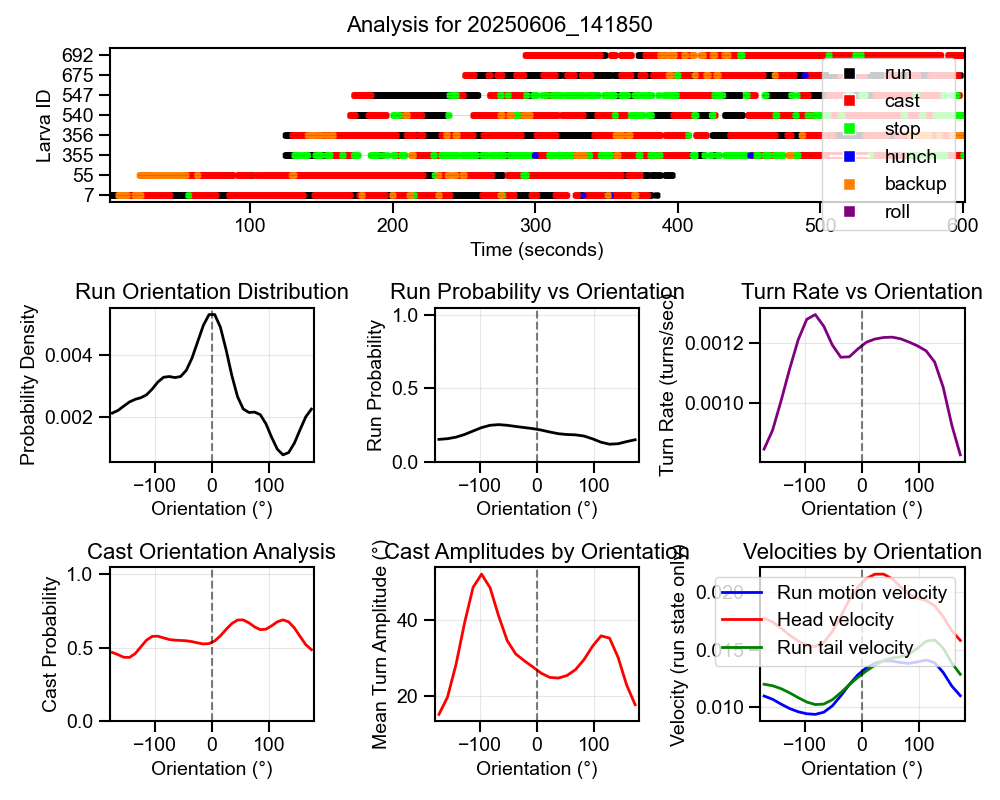

Analyzing 20250610_145557...
Saved figure to ../results/analysis/Sharbat_DAN_data_June2025/20250610_145557/analysis_20250610_145557.png


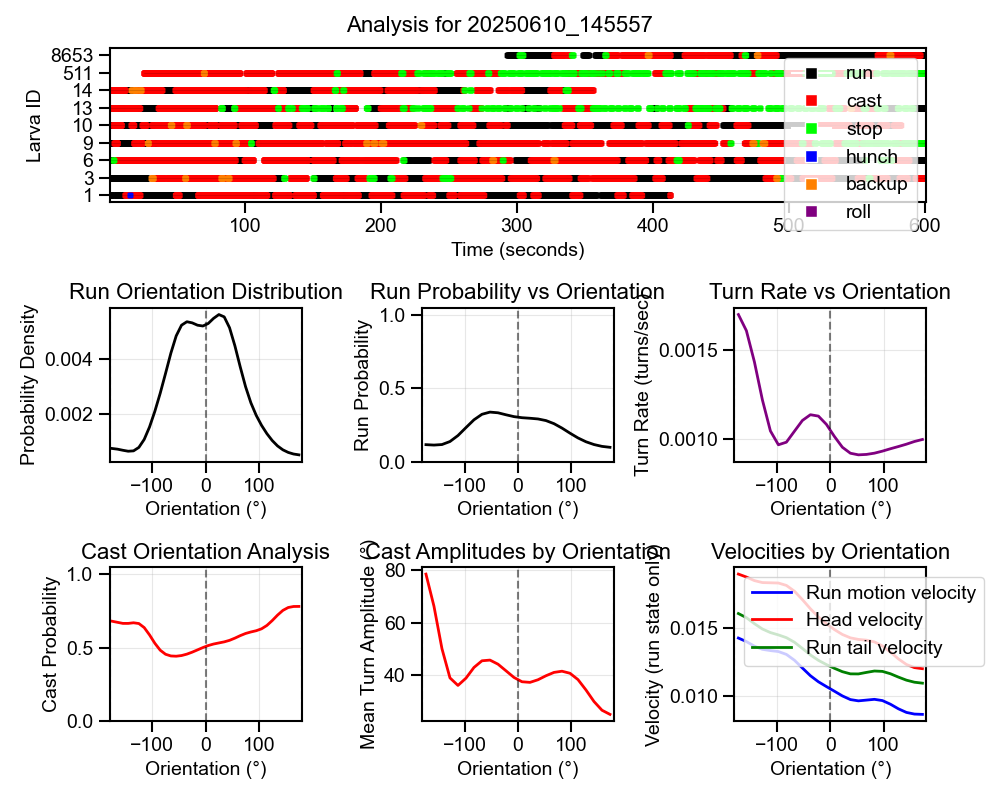

Analyzing 20250613_114054...
Saved figure to ../results/analysis/Sharbat_DAN_data_June2025/20250613_114054/analysis_20250613_114054.png


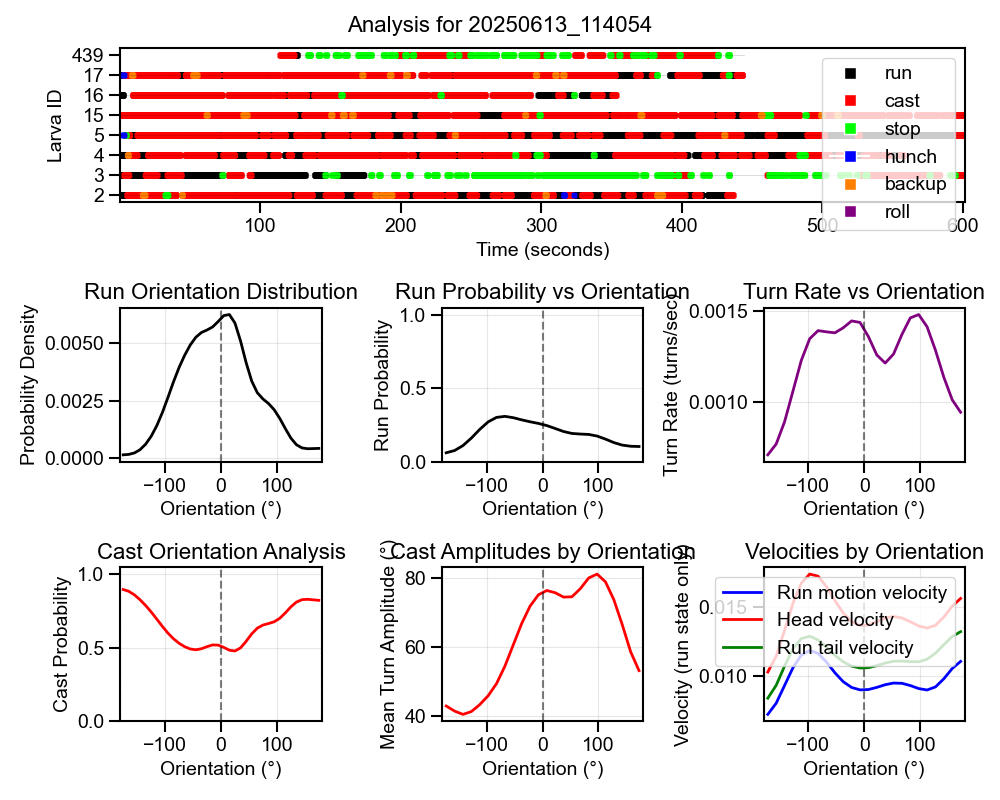

Saved combined analysis to ../results/analysis/Sharbat_DAN_data_June2025/analysis_all_combined.png and ../results/analysis/Sharbat_DAN_data_June2025/analysis_all_combined.pdf


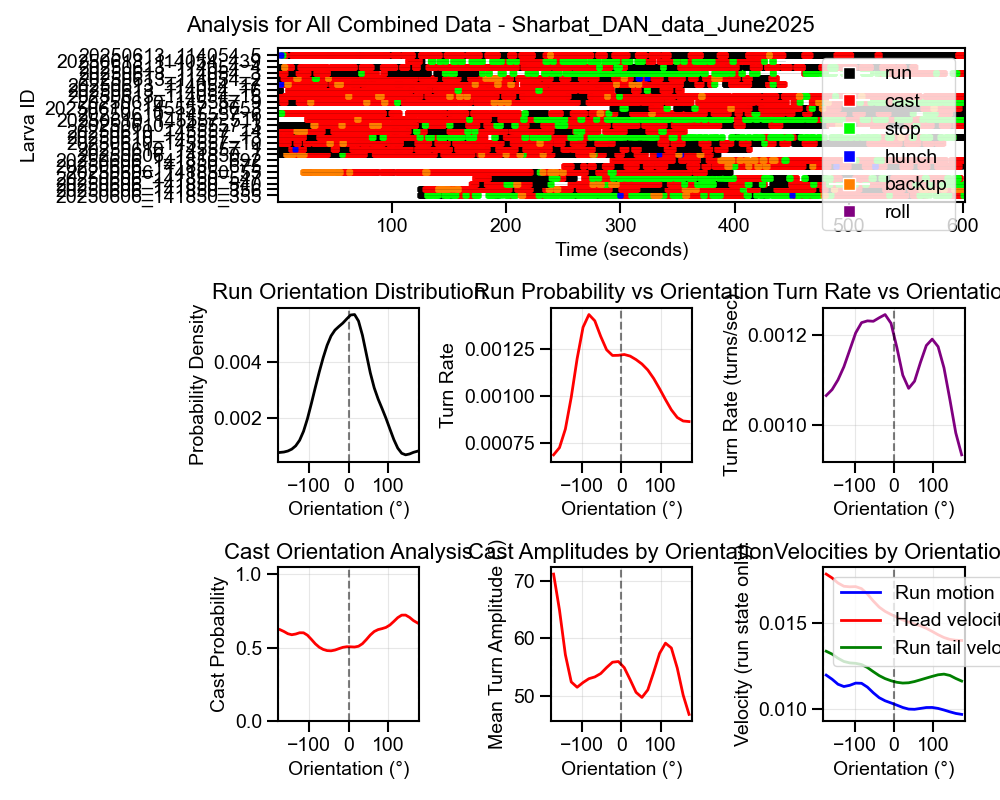

In [25]:
# Plot analysis for each date
for date_key, date_data in all_dates_data.items():
    if date_key != 'all_combined':
        analyze_date(date_data, output_dir)

# Now process the combined data and save it in the genotype root directory
if 'all_combined' in all_dates_data:
    combined_data = all_dates_data['all_combined']
    
    # Create the figure for combined data
    fig = plt.figure(figsize=(10,8))
    fig.suptitle(f"Analysis for All Combined Data - {genotype}", fontsize=16)
    gs = GridSpec(3, 3, figure=fig)
    
    # 1. Ethogram (spans the full first row)
    ax1 = fig.add_subplot(gs[0, :])
    plot_global_behavior_matrix(
        combined_data['merged_data'], show_separate_totals=False, show_plot=False, ax=ax1
    )
    
    # 2. Run orientation distribution
    ax2 = fig.add_subplot(gs[1, 0])
    analyze_run_orientations_all(
        combined_data['merged_data'], show_plot=False, ax=ax2
    )
    ax2.set_title("Run Orientation Distribution")
    
    # 3. Run probability by orientation
    ax3 = fig.add_subplot(gs[1, 1])
    analyze_turn_rate_by_orientation_new(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax3
    )
    ax3.set_title("Run Probability vs Orientation")

    # 4. Turn rate by orientation
    ax4 = fig.add_subplot(gs[1, 2])
    analyze_turn_rate_by_orientation_true(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax4
    )
    ax4.set_title("Turn Rate vs Orientation")

    # 5. Cast orientation analysis
    ax5 = fig.add_subplot(gs[2, 0])
    analyze_cast_orientations_all_true(
        combined_data['merged_data'], show_plot=False, ax=ax5
    )
    ax5.set_title("Cast Orientation Analysis")

    # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 1])
    analyze_turn_amplitudes_by_orientation(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax6
    )
    ax6.set_title("Cast Amplitudes by Orientation")
    
    # 7. Velocities by orientation
    ax7 = fig.add_subplot(gs[2, 2])
    analyze_velocity_by_orientation(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax7
    )
    ax7.set_title("Velocities by Orientation")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    
    # Save directly to genotype folder (not in date subfolder)
    save_path_png = os.path.join(output_dir, "analysis_all_combined.png")
    save_path_pdf = os.path.join(output_dir, "analysis_all_combined.pdf")
    plt.savefig(save_path_png)
    plt.savefig(save_path_pdf)
    print(f"Saved combined analysis to {save_path_png} and {save_path_pdf}")
     
    plt.show()

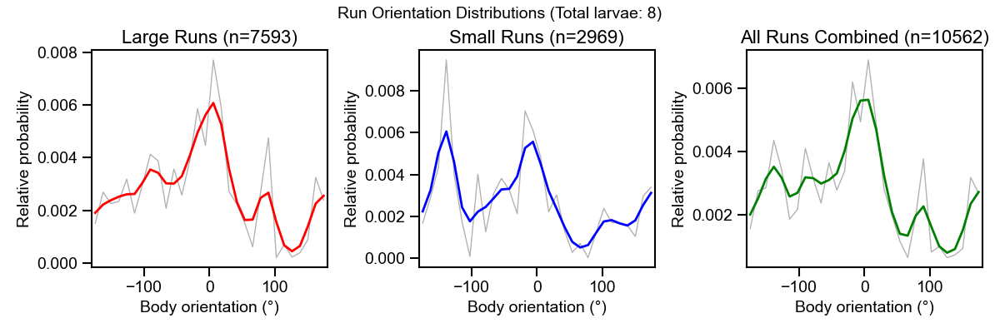

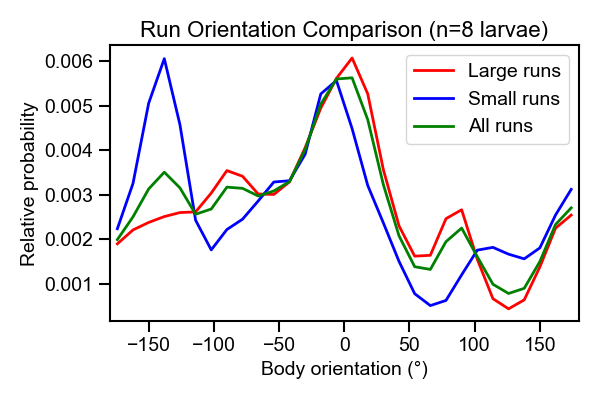

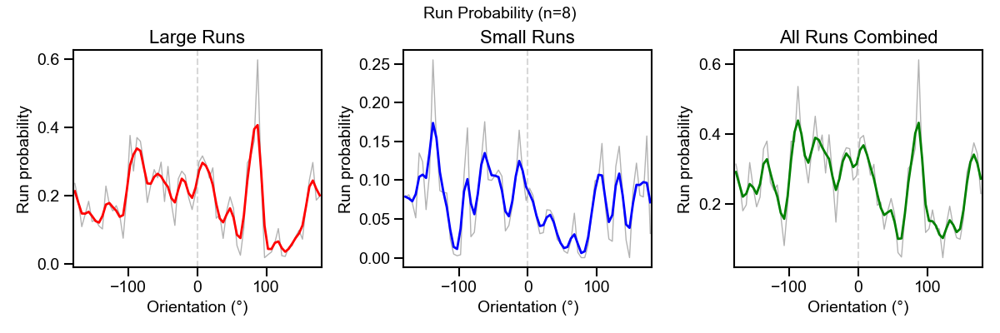

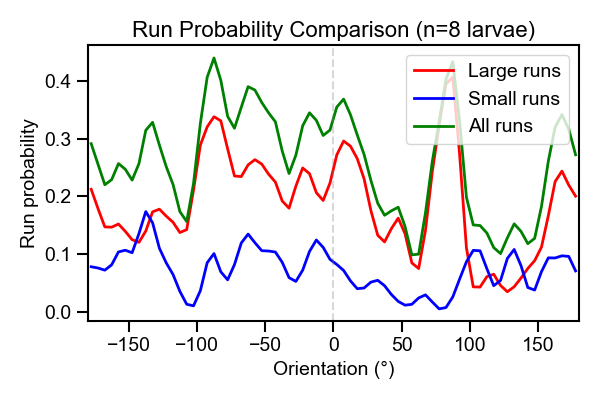

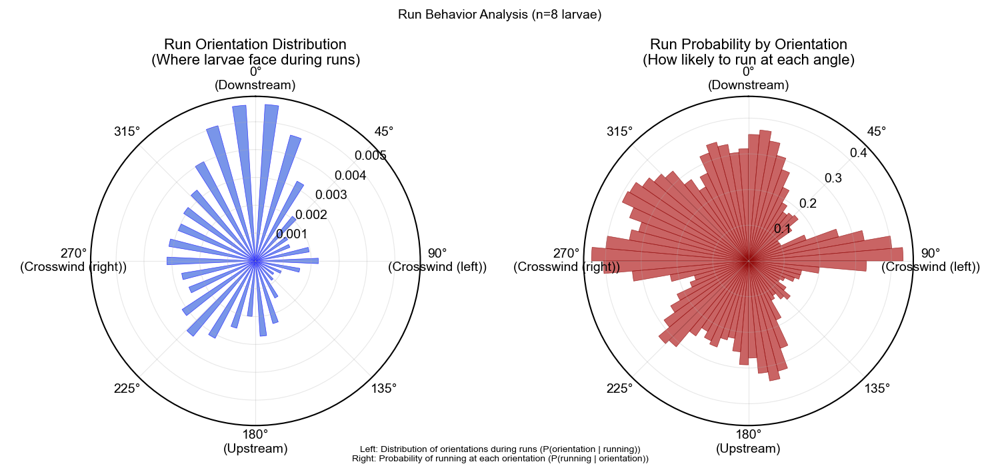

...

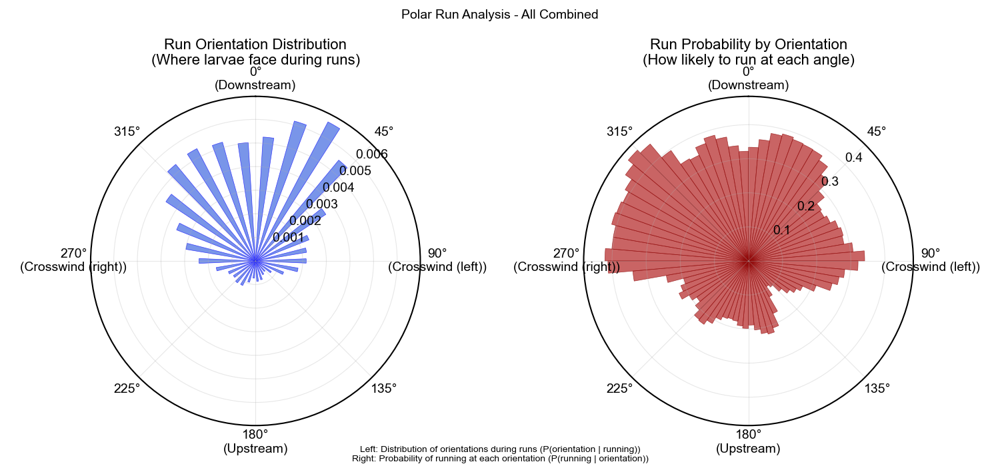

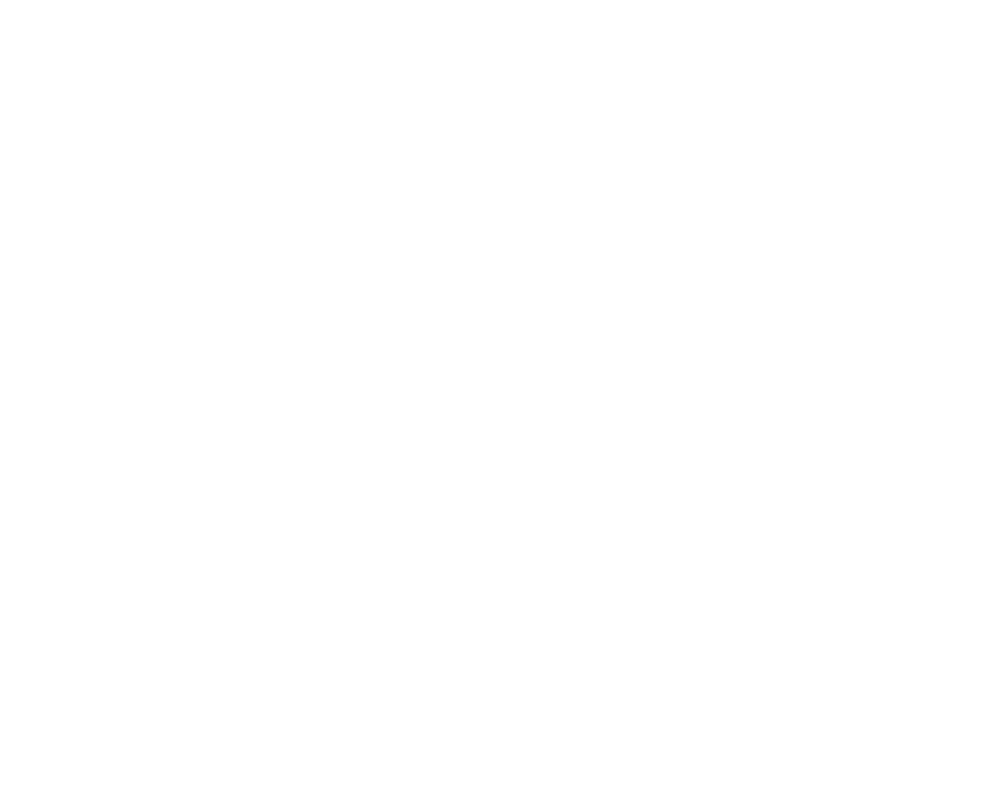

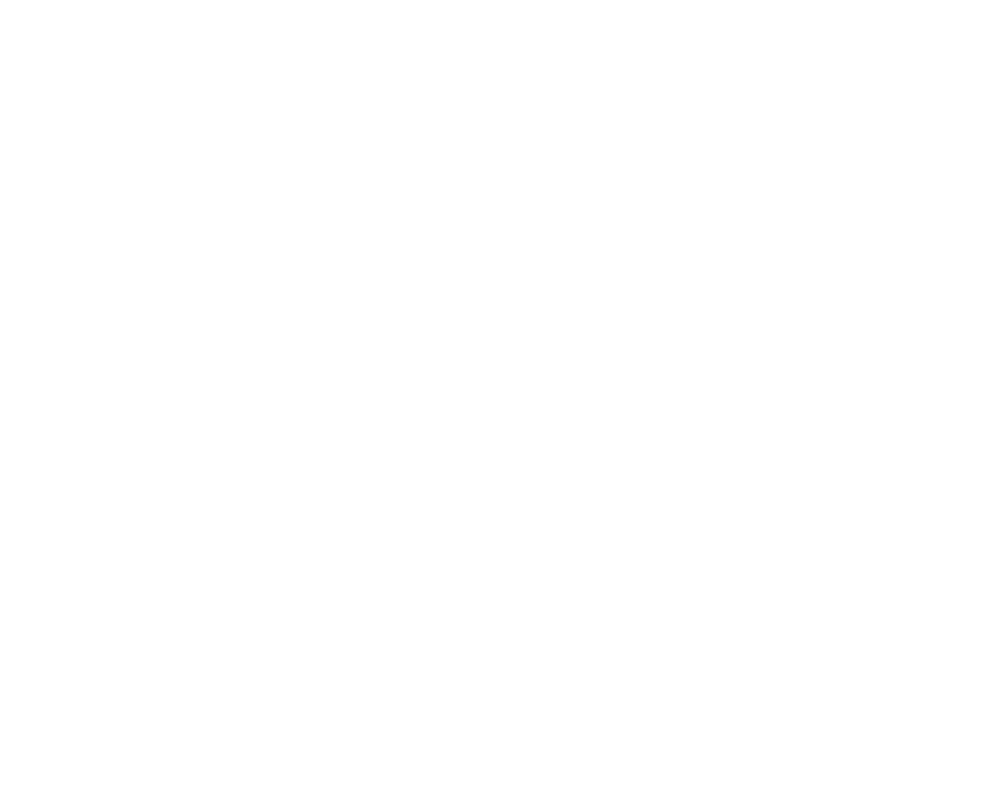

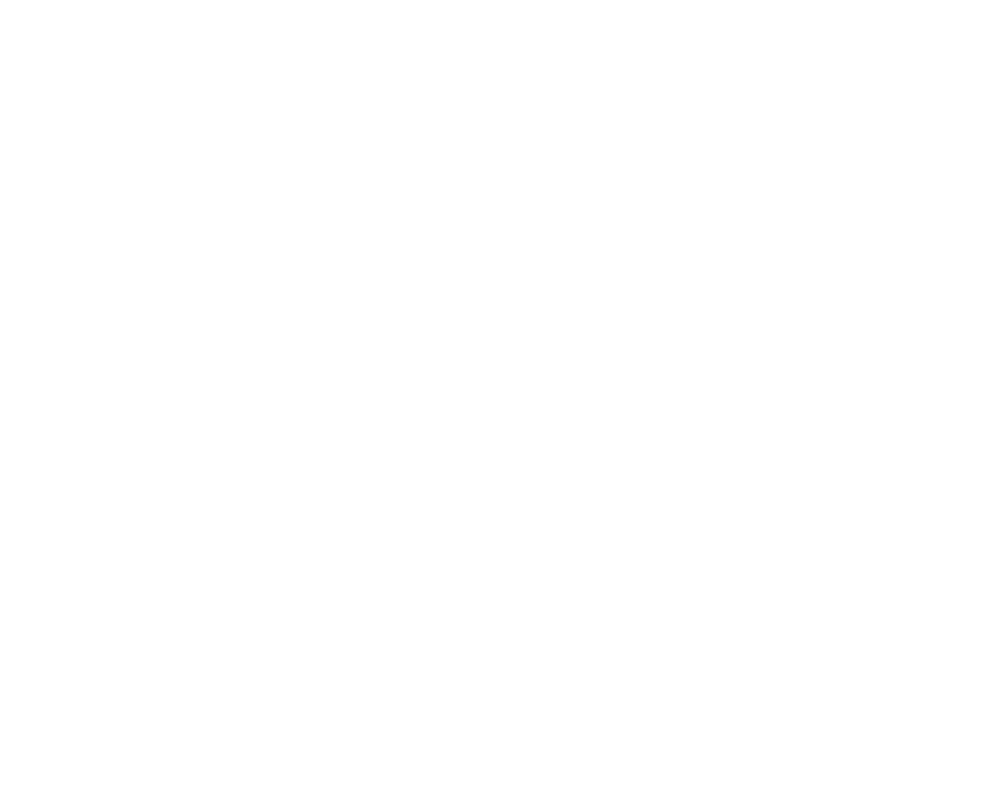

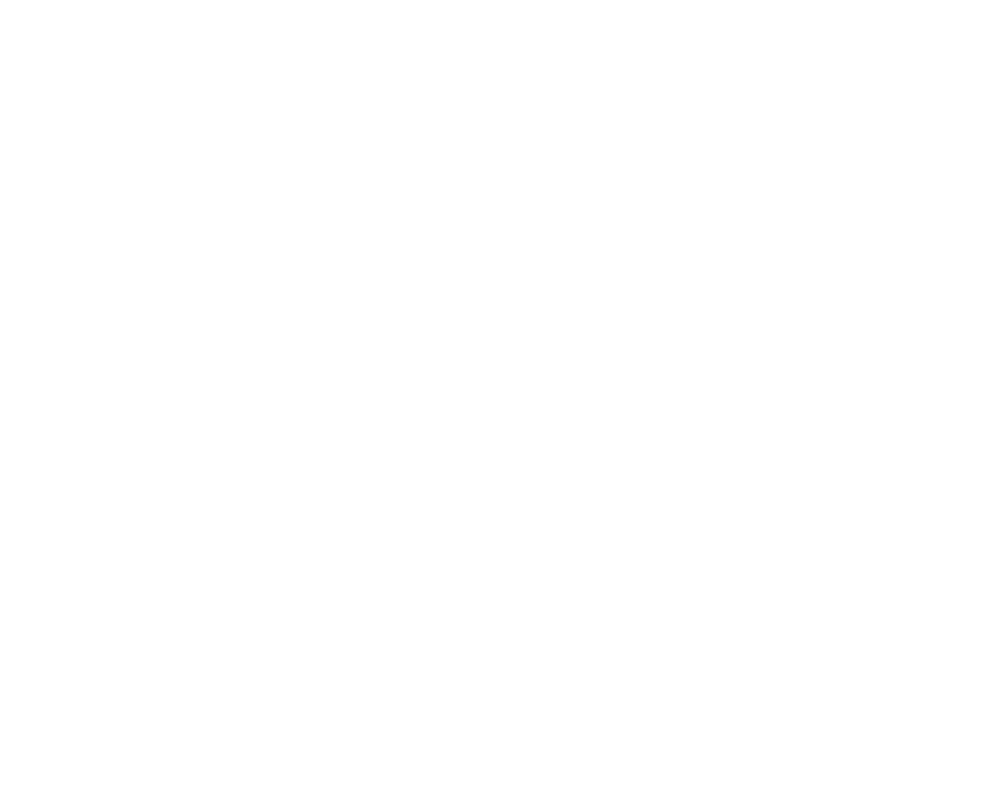

In [26]:
# Create polar run analysis plots
for date_key, date_data in all_dates_data.items():
    plt.figure(figsize=(10, 8))
    
    # Use the merged data for polar analysis
    merged_data = date_data['merged_data']
    
    # Create polar plot
    results = processor.plot_polar_run_histograms(
        merged_data, 
        bin_width=5,
        save_path=os.path.join(output_dir, f"polar_run_{date_key}.png")
    )
    
    plt.suptitle(f"Polar Run Analysis - {date_data['date_str']}", fontsize=14)
    plt.show()